In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from templates import *
from templates_cls import *
from experiment_classifier import ClsModel

In [3]:
device = 'cuda:0'
conf = ffhq256_autoenc()
# print(conf.name)
model = LitModel(conf)
state = torch.load(f'checkpoints/{conf.name}/last.ckpt', map_location='cpu')
model.load_state_dict(state['state_dict'], strict=False)
model.ema_model.eval()
model.ema_model.to(device);

Global seed set to 0


Model params: 160.69 M


In [4]:
cls_conf = ffhq256_autoenc_cls()
cls_model = ClsModel(cls_conf)
state = torch.load(f'checkpoints/{cls_conf.name}/last.ckpt',
                    map_location='cpu')
print('latent step:', state['global_step'])
cls_model.load_state_dict(state['state_dict'], strict=False)
cls_model.to(device);

Global seed set to 0


loading pretrain ... 130M
step: 1563562
loading latent stats ...
latent step: 9375


## 選択

In [21]:
img_from_base_dir = 'imgs_test/imgs_synthetic'
from_dirs = []
for i,file in enumerate(os.listdir(img_from_base_dir)):
    print(f'{i:2}: {file}')
    from_dirs.append(file)

 0: mio_silence-mio_happy
 1: mio_silence-mio_shock
 2: mio_silence-mio_u
 3: ookawa_default-ookawa_angry
 4: ookawa_default-ookawa_angry2
 5: ookawa_default-ookawa_high
 6: ookawa_default-ookawa_regret
 7: ookawa_default-ookawa_smile
 8: ookawa_default-ookawa_surprised
 9: saki-saki_glasses
10: yotaka_bald-yotaka_bushy
11: yotaka_default-yotaka_angry
12: yotaka_default-yotaka_angry2
13: yotaka_default-yotaka_gj
14: yotaka_default-yotaka_smile
15: yotaka_default-yotaka_smile2


In [31]:
img_from_dir = img_from_base_dir + f"/{from_dirs[14]}"  # 選択
name_from_dir = from_dirs[14]

for i,file in enumerate(os.listdir(img_from_dir)):
    print(f'{i:2}: {file}')

 0: eye-mouth.png
 1: eye.png
 2: eye2.png
 3: face-all.png
 4: mouth-nose.png
 5: mouth.png
 6: original_from.png
 7: original_to.png
 8: pose_from.png
 9: pose_to.png


In [32]:
img_to_dir = 'imgs_align'
for i,file in enumerate(os.listdir(img_to_dir)):
    print(f'{i:2}: {file}')

 0: azuki_default.png
 1: ceo_default.png
 2: check1.png
 3: check2.png
 4: danda_default.png
 5: detective.png
 6: detective_02.png
 7: idPhoto.png
 8: mio_happy.png
 9: mio_shock.png
10: mio_silence.png
11: mio_u.png
12: nanko_default.png
13: ookawa_angry.png
14: ookawa_angry2.png
15: ookawa_default.png
16: ookawa_high.png
17: ookawa_regret.png
18: ookawa_smile.png
19: ookawa_surprised.png
20: pharmacist.png
21: saki.png
22: saki_glasses.png
23: sandy.png
24: takebe_default.png
25: test01.png
26: test01_02.png
27: test01_03.png
28: test01_04.png
29: test02.png
30: woman_default.png
31: yotaka_angry.png
32: yotaka_angry2.png
33: yotaka_bald.png
34: yotaka_bushy.png
35: yotaka_default.png
36: yotaka_gj.png
37: yotaka_smile.png
38: yotaka_smile2.png


In [33]:
data = ImageDataset(img_from_dir, image_size=conf.img_size, exts=['jpg', 'JPG', 'png'], do_augment=False, sort_names=True)
ind_batch_from = [6,7,8,9,3,1,2,5,0,4]  # [ori_fm, ori_to, pose_fm_pose_to, fall, eye, eye2, mouth, eyemouth, mouthnose] いじらない
batch_from = np.array(data[ind_batch_from[0]]['img'][None])
names_batch_from = [os.path.splitext(str(data.paths[ind_batch_from[0]]))[0]]
for i in range(1, len(ind_batch_from)):
    batch_from = np.append(batch_from, data[ind_batch_from[i]]['img'][None], axis=0)
    names_batch_from.append(os.path.splitext(str(data.paths[ind_batch_from[i]]))[0])
batch_from = torch.tensor(batch_from)

data2 = ImageDataset(img_to_dir, image_size=conf.img_size, exts=['jpg', 'JPG', 'png'], do_augment=False)
ind_batch_to = [30,27,24,1,3,4,12]  # 選択
batch_to = np.array(data2[ind_batch_to[0]]['img'][None])
names_batch_to = [os.path.splitext(str(data2.paths[ind_batch_to[0]]))[0]]
for i in range(1, len(ind_batch_to)):
    batch_to = np.append(batch_to, data2[ind_batch_to[i]]['img'][None], axis=0)
    names_batch_to.append(os.path.splitext(str(data2.paths[ind_batch_to[i]]))[0])
batch_to = torch.tensor(batch_to)

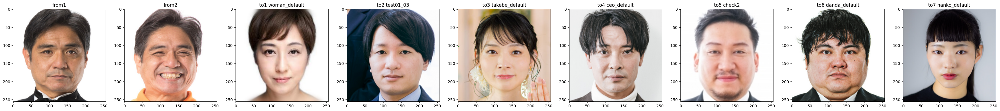

In [34]:
import matplotlib.pyplot as plt

num_to = len(batch_to)
fig, ax = plt.subplots(1, 2+num_to, figsize=(5*(2+num_to), 5))
for i in range(2):
    ax[i].imshow(batch_from[i].permute([1, 2, 0]) / 2 + 0.5)
    ax[i].set_title(f"from{i+1}")

for i in range(num_to):
    ax[i+2].imshow(batch_to[i].permute([1, 2, 0]) / 2 + 0.5)
    ax[i+2].set_title(f"to{i+1} {names_batch_to[i]}")

plt.show()

In [35]:
cond_from = model.encode(batch_from.to(device))
cond_to = model.encode(batch_to.to(device))
cond_to_norm = cls_model.normalize(cond_to)
xT = model.encode_stochastic(batch_to.to(device), cond_to, T=250)

In [36]:
alpha = torch.tensor(np.linspace(0, 1, 11, dtype=np.float32)).to(device)

## all

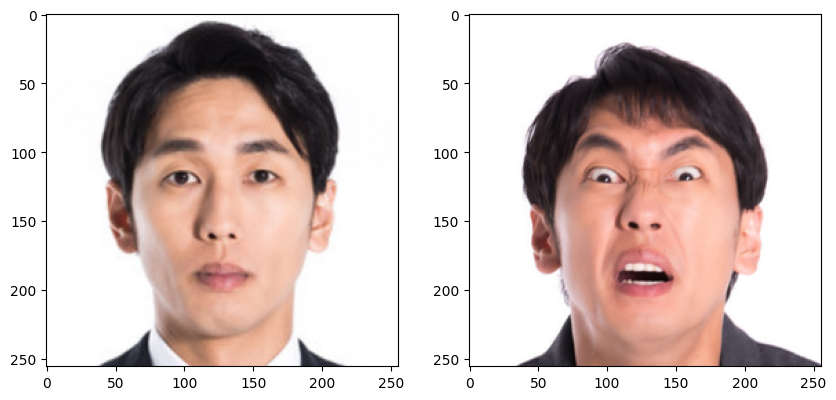

In [12]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(5*2, 5))
ax[0].imshow(batch_from[0].permute([1, 2, 0]) / 2 + 0.5)
ax[1].imshow(batch_from[1].permute([1, 2, 0]) / 2 + 0.5)
plt.show()

In [ ]:
cond_change_all = cls_model.normalize(cond_from[1][None]) - cls_model.normalize(cond_from[0][None])

preds_all = []
for i, alp in enumerate(alpha):
    cond2 = cond_to_norm + alp * cond_change_all
    cond2 = cls_model.denormalize(cond2)
    pred = model.render(xT, cond2, T=100)
    preds_all.append(pred)

In [ ]:
preds_all = torch.stack(preds_all)
preds_all = preds_all.permute(1,0,2,3,4)

In [ ]:
import matplotlib.pyplot as plt

num_show = 5
fig,ax = plt.subplots(num_to, num_show, figsize=(5*num_show, 5*num_to))
for i,pred in enumerate(preds_all):
    for j,k in enumerate(np.linspace(0,len(pred)-1,num_show,dtype=np.uint8)):
        if len(preds_all) < 2:
            ax[j].imshow(pred[k].permute(1,2,0).cpu())
            ax[j].set_title(np.array(alpha[k].cpu()))
            ax[j].axis('off')
        else:
            ax[i,j].imshow(pred[k].permute(1,2,0).cpu())
            if i == 0:
                ax[i,j].set_title(np.array(alpha[k].cpu()))
            ax[i,j].axis('off')

In [ ]:
from PIL import Image

preds_all_pil = []
for pred in preds_all:
    pred_pil = []
    for p in pred:
        p_np = np.array((p*255).permute(1,2,0).cpu()).astype(np.uint8)
        pred_pil.append(Image.fromarray(p_np))
    preds_all_pil.append(pred_pil)

## pose

In [ ]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(5*2, 5))
ax[0].imshow(batch_from[2].permute([1, 2, 0]) / 2 + 0.5)
ax[1].imshow(batch_from[3].permute([1, 2, 0]) / 2 + 0.5)
plt.show()

In [ ]:
cond_change_pose = cls_model.normalize(cond_from[3][None]) - cls_model.normalize(cond_from[2][None])

preds_pose = []
for i, alp in enumerate(alpha):
    cond2 = cond_to_norm + alp * cond_change_pose
    cond2 = cls_model.denormalize(cond2)
    pred = model.render(xT, cond2, T=100)
    preds_pose.append(pred)

In [ ]:
preds_pose = torch.stack(preds_pose)
preds_pose = preds_pose.permute(1,0,2,3,4)

In [ ]:
import matplotlib.pyplot as plt

num_show = 5
fig,ax = plt.subplots(num_to, num_show, figsize=(5*num_show, 5*num_to))
for i,pred in enumerate(preds_pose):
    for j,k in enumerate(np.linspace(0,len(pred)-1,num_show,dtype=np.uint8)):
        if len(preds_pose) < 2:
            ax[j].imshow(pred[k].permute(1,2,0).cpu())
            ax[j].set_title(np.array(alpha[k].cpu()))
            ax[j].axis('off')
        else:
            ax[i,j].imshow(pred[k].permute(1,2,0).cpu())
            if i == 0:
                ax[i,j].set_title(np.array(alpha[k].cpu()))
            ax[i,j].axis('off')

In [ ]:
from PIL import Image

preds_pose_pil = []
for pred in preds_pose:
    pred_pil = []
    for p in pred:
        p_np = np.array((p*255).permute(1,2,0).cpu()).astype(np.uint8)
        pred_pil.append(Image.fromarray(p_np))
    preds_pose_pil.append(pred_pil)

## face-all

In [ ]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(5*2, 5))
ax[0].imshow(batch_from[0].permute([1, 2, 0]) / 2 + 0.5)
ax[1].imshow(batch_from[4].permute([1, 2, 0]) / 2 + 0.5)
plt.show()

In [ ]:
cond_change_faceall = cls_model.normalize(cond_from[4][None]) - cls_model.normalize(cond_from[0][None])

preds_faceall = []
for i, alp in enumerate(alpha):
    cond2 = cond_to_norm + alp * cond_change_faceall
    cond2 = cls_model.denormalize(cond2)
    pred = model.render(xT, cond2, T=100)
    preds_faceall.append(pred)

In [ ]:
preds_faceall = torch.stack(preds_faceall)
preds_faceall = preds_faceall.permute(1,0,2,3,4)

In [ ]:
import matplotlib.pyplot as plt

num_show = 5
fig,ax = plt.subplots(num_to, num_show, figsize=(5*num_show, 5*num_to))
for i,pred in enumerate(preds_faceall):
    for j,k in enumerate(np.linspace(0,len(pred)-1,num_show,dtype=np.uint8)):
        if len(preds_faceall) < 2:
            ax[j].imshow(pred[k].permute(1,2,0).cpu())
            ax[j].set_title(np.array(alpha[k].cpu()))
            ax[j].axis('off')
        else:
            ax[i,j].imshow(pred[k].permute(1,2,0).cpu())
            if i == 0:
                ax[i,j].set_title(np.array(alpha[k].cpu()))
            ax[i,j].axis('off')

In [ ]:
from PIL import Image

preds_faceall_pil = []
for pred in preds_faceall:
    pred_pil = []
    for p in pred:
        p_np = np.array((p*255).permute(1,2,0).cpu()).astype(np.uint8)
        pred_pil.append(Image.fromarray(p_np))
    preds_faceall_pil.append(pred_pil)

## eye

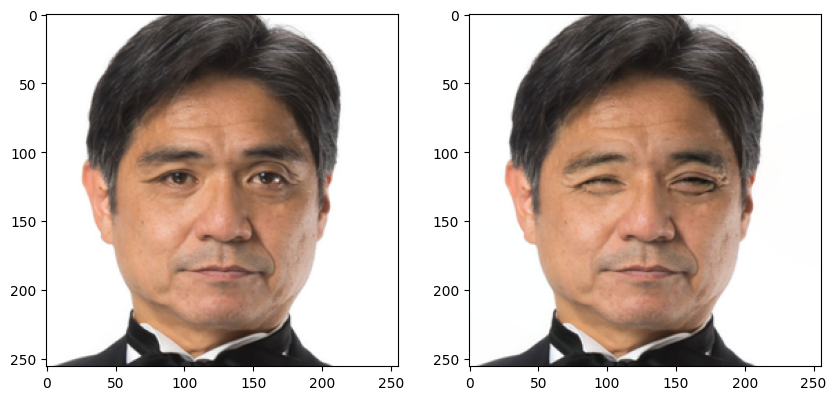

In [37]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(5*2, 5))
ax[0].imshow(batch_from[0].permute([1, 2, 0]) / 2 + 0.5)
ax[1].imshow(batch_from[5].permute([1, 2, 0]) / 2 + 0.5)
plt.show()

In [38]:
cond_change_eye = cls_model.normalize(cond_from[5][None]) - cls_model.normalize(cond_from[0][None])

preds_eye = []
for i, alp in enumerate(alpha):
    cond2 = cond_to_norm + alp * cond_change_eye
    cond2 = cls_model.denormalize(cond2)
    pred = model.render(xT, cond2, T=100)
    preds_eye.append(pred)

In [39]:
preds_eye = torch.stack(preds_eye)
preds_eye = preds_eye.permute(1,0,2,3,4)

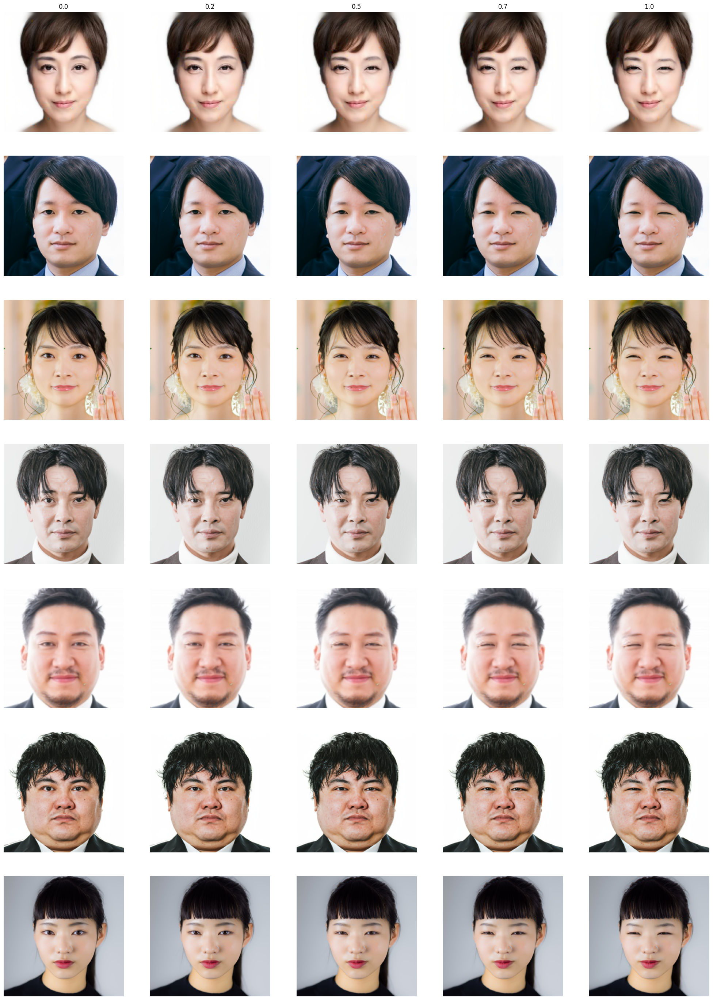

In [40]:
import matplotlib.pyplot as plt

num_show = 5
fig,ax = plt.subplots(num_to, num_show, figsize=(5*num_show, 5*num_to))
for i,pred in enumerate(preds_eye):
    for j,k in enumerate(np.linspace(0,len(pred)-1,num_show,dtype=np.uint8)):
        if len(preds_eye) < 2:
            ax[j].imshow(pred[k].permute(1,2,0).cpu())
            ax[j].set_title(np.array(alpha[k].cpu()))
            ax[j].axis('off')
        else:
            ax[i,j].imshow(pred[k].permute(1,2,0).cpu())
            if i == 0:
                ax[i,j].set_title(np.array(alpha[k].cpu()))
            ax[i,j].axis('off')

In [41]:
from PIL import Image

preds_eye_pil = []
for pred in preds_eye:
    pred_pil = []
    for p in pred:
        p_np = np.array((p*255).permute(1,2,0).cpu()).astype(np.uint8)
        pred_pil.append(Image.fromarray(p_np))
    preds_eye_pil.append(pred_pil)

## eye2

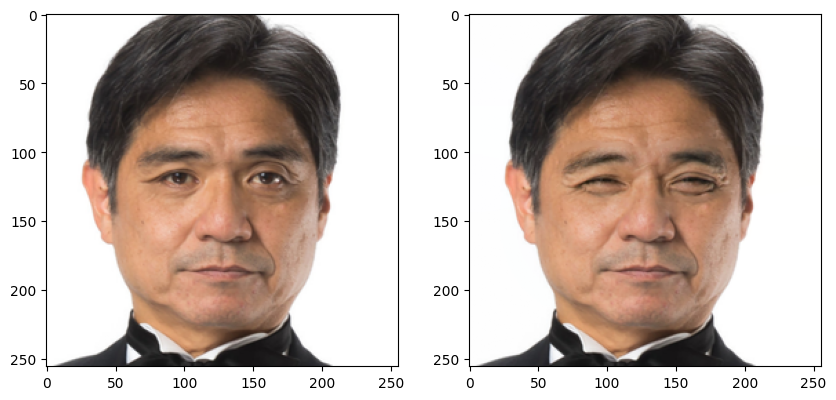

In [42]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(5*2, 5))
ax[0].imshow(batch_from[0].permute([1, 2, 0]) / 2 + 0.5)
ax[1].imshow(batch_from[6].permute([1, 2, 0]) / 2 + 0.5)
plt.show()

In [43]:
cond_change_eye2 = cls_model.normalize(cond_from[6][None]) - cls_model.normalize(cond_from[0][None])

preds_eye2 = []
for i, alp in enumerate(alpha):
    cond2 = cond_to_norm + alp * cond_change_eye2
    cond2 = cls_model.denormalize(cond2)
    pred = model.render(xT, cond2, T=100)
    preds_eye2.append(pred)

In [44]:
preds_eye2 = torch.stack(preds_eye2)
preds_eye2 = preds_eye2.permute(1,0,2,3,4)

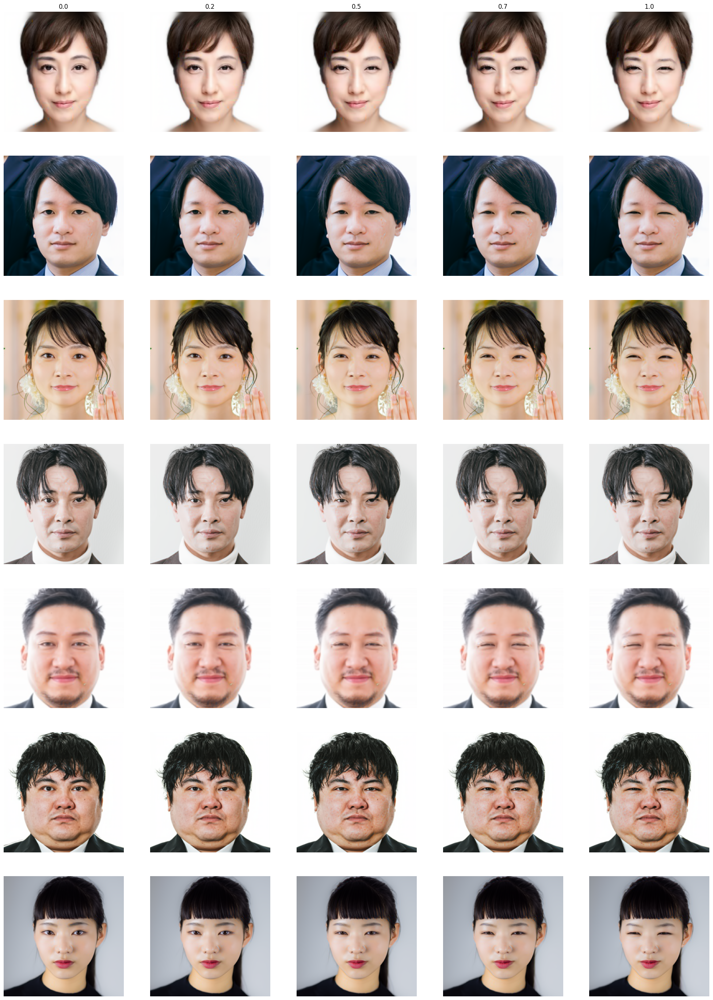

In [45]:
import matplotlib.pyplot as plt

num_show = 5
fig,ax = plt.subplots(num_to, num_show, figsize=(5*num_show, 5*num_to))
for i,pred in enumerate(preds_eye2):
    for j,k in enumerate(np.linspace(0,len(pred)-1,num_show,dtype=np.uint8)):
        if len(preds_eye2) < 2:
            ax[j].imshow(pred[k].permute(1,2,0).cpu())
            ax[j].set_title(np.array(alpha[k].cpu()))
            ax[j].axis('off')
        else:
            ax[i,j].imshow(pred[k].permute(1,2,0).cpu())
            if i == 0:
                ax[i,j].set_title(np.array(alpha[k].cpu()))
            ax[i,j].axis('off')

In [46]:
from PIL import Image

preds_eye2_pil = []
for pred in preds_eye2:
    pred_pil = []
    for p in pred:
        p_np = np.array((p*255).permute(1,2,0).cpu()).astype(np.uint8)
        pred_pil.append(Image.fromarray(p_np))
    preds_eye2_pil.append(pred_pil)

## mouth

In [ ]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(5*2, 5))
ax[0].imshow(batch_from[0].permute([1, 2, 0]) / 2 + 0.5)
ax[1].imshow(batch_from[7].permute([1, 2, 0]) / 2 + 0.5)
plt.show()

In [ ]:
cond_change_mouth = cls_model.normalize(cond_from[7][None]) - cls_model.normalize(cond_from[0][None])

preds_mouth = []
for i, alp in enumerate(alpha):
    cond2 = cond_to_norm + alp * cond_change_mouth
    cond2 = cls_model.denormalize(cond2)
    pred = model.render(xT, cond2, T=100)
    preds_mouth.append(pred)

In [ ]:
preds_mouth = torch.stack(preds_mouth)
preds_mouth = preds_mouth.permute(1,0,2,3,4)

In [ ]:
import matplotlib.pyplot as plt

num_show = 5
fig,ax = plt.subplots(num_to, num_show, figsize=(5*num_show, 5*num_to))
for i,pred in enumerate(preds_mouth):
    for j,k in enumerate(np.linspace(0,len(pred)-1,num_show,dtype=np.uint8)):
        if len(preds_mouth) < 2:
            ax[j].imshow(pred[k].permute(1,2,0).cpu())
            ax[j].set_title(np.array(alpha[k].cpu()))
            ax[j].axis('off')
        else:
            ax[i,j].imshow(pred[k].permute(1,2,0).cpu())
            if i == 0:
                ax[i,j].set_title(np.array(alpha[k].cpu()))
            ax[i,j].axis('off')

In [ ]:
from PIL import Image

preds_mouth_pil = []
for pred in preds_mouth:
    pred_pil = []
    for p in pred:
        p_np = np.array((p*255).permute(1,2,0).cpu()).astype(np.uint8)
        pred_pil.append(Image.fromarray(p_np))
    preds_mouth_pil.append(pred_pil)

## eye&mouth

In [ ]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(5*2, 5))
ax[0].imshow(batch_from[0].permute([1, 2, 0]) / 2 + 0.5)
ax[1].imshow(batch_from[8].permute([1, 2, 0]) / 2 + 0.5)
plt.show()

In [ ]:
cond_change_eyemouth = cls_model.normalize(cond_from[8][None]) - cls_model.normalize(cond_from[0][None])

preds_eyemouth = []
for i, alp in enumerate(alpha):
    cond2 = cond_to_norm + alp * cond_change_eyemouth
    cond2 = cls_model.denormalize(cond2)
    pred = model.render(xT, cond2, T=100)
    preds_eyemouth.append(pred)

In [ ]:
preds_eyemouth = torch.stack(preds_eyemouth)
preds_eyemouth = preds_eyemouth.permute(1,0,2,3,4)

In [ ]:
import matplotlib.pyplot as plt

num_show = 5
fig,ax = plt.subplots(num_to, num_show, figsize=(5*num_show, 5*num_to))
for i,pred in enumerate(preds_eyemouth):
    for j,k in enumerate(np.linspace(0,len(pred)-1,num_show,dtype=np.uint8)):
        if len(preds_eyemouth) < 2:
            ax[j].imshow(pred[k].permute(1,2,0).cpu())
            ax[j].set_title(np.array(alpha[k].cpu()))
            ax[j].axis('off')
        else:
            ax[i,j].imshow(pred[k].permute(1,2,0).cpu())
            if i == 0:
                ax[i,j].set_title(np.array(alpha[k].cpu()))
            ax[i,j].axis('off')

In [ ]:
from PIL import Image

preds_eyemouth_pil = []
for pred in preds_eyemouth:
    pred_pil = []
    for p in pred:
        p_np = np.array((p*255).permute(1,2,0).cpu()).astype(np.uint8)
        pred_pil.append(Image.fromarray(p_np))
    preds_eyemouth_pil.append(pred_pil)

## mouth&nose

In [ ]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(5*2, 5))
ax[0].imshow(batch_from[0].permute([1, 2, 0]) / 2 + 0.5)
ax[1].imshow(batch_from[9].permute([1, 2, 0]) / 2 + 0.5)
plt.show()

In [ ]:
cond_change_mouthnose = cls_model.normalize(cond_from[9][None]) - cls_model.normalize(cond_from[0][None])

preds_mouthnose = []
for i, alp in enumerate(alpha):
    cond2 = cond_to_norm + alp * cond_change_mouthnose
    cond2 = cls_model.denormalize(cond2)
    pred = model.render(xT, cond2, T=100)
    preds_mouthnose.append(pred)

In [ ]:
preds_mouthnose = torch.stack(preds_mouthnose)
preds_mouthnose = preds_mouthnose.permute(1,0,2,3,4)

In [ ]:
import matplotlib.pyplot as plt

num_show = 5
fig,ax = plt.subplots(num_to, num_show, figsize=(5*num_show, 5*num_to))
for i,pred in enumerate(preds_mouthnose):
    for j,k in enumerate(np.linspace(0,len(pred)-1,num_show,dtype=np.uint8)):
        if len(preds_mouthnose) < 2:
            ax[j].imshow(pred[k].permute(1,2,0).cpu())
            ax[j].set_title(np.array(alpha[k].cpu()))
            ax[j].axis('off')
        else:
            ax[i,j].imshow(pred[k].permute(1,2,0).cpu())
            if i == 0:
                ax[i,j].set_title(np.array(alpha[k].cpu()))
            ax[i,j].axis('off')

In [ ]:
from PIL import Image

preds_mouthnose_pil = []
for pred in preds_mouthnose:
    pred_pil = []
    for p in pred:
        p_np = np.array((p*255).permute(1,2,0).cpu()).astype(np.uint8)
        pred_pil.append(Image.fromarray(p_np))
    preds_mouthnose_pil.append(pred_pil)

## gifの保存

### all

In [ ]:
dst_dir = f"imgs_test/imgs_parts_transfer/{name_from_dir}"
for i,pred_pil in enumerate(preds_all_pil):
    dst_dir_parts = f"{dst_dir}/{names_batch_to[i]}/all/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    file_name = f"amp{np.array(alpha.detach().cpu())[0]:.2f}_{np.array(alpha.detach().cpu())[-1]:.2f}_{len(alpha)}.gif"
    dst_path = dst_dir_parts + file_name

    pred_pil[0].save(
        dst_path,
        format="gif",
        save_all=True,
        append_images=pred_pil,
        duration=3000//(len(alpha)),
        loop=0,
    )

### pose

In [ ]:
dst_dir = f"imgs_test/imgs_parts_transfer/{name_from_dir}"
for i,pred_pil in enumerate(preds_pose_pil):
    dst_dir_parts = f"{dst_dir}/{names_batch_to[i]}/pose/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    file_name = f"amp{np.array(alpha.detach().cpu())[0]:.2f}_{np.array(alpha.detach().cpu())[-1]:.2f}_{len(alpha)}.gif"
    dst_path = dst_dir_parts + file_name

    pred_pil[0].save(
        dst_path,
        format="gif",
        save_all=True,
        append_images=pred_pil,
        duration=3000//(len(alpha)),
        loop=0,
    )

### face-all

In [ ]:
dst_dir = f"imgs_test/imgs_parts_transfer/{name_from_dir}"
for i,pred_pil in enumerate(preds_faceall_pil):
    dst_dir_parts = f"{dst_dir}/{names_batch_to[i]}/face-all/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    file_name = f"amp{np.array(alpha.detach().cpu())[0]:.2f}_{np.array(alpha.detach().cpu())[-1]:.2f}_{len(alpha)}.gif"
    dst_path = dst_dir_parts + file_name

    pred_pil[0].save(
        dst_path,
        format="gif",
        save_all=True,
        append_images=pred_pil,
        duration=3000//(len(alpha)),
        loop=0,
    )

### eye

In [47]:
dst_dir = f"imgs_test/imgs_parts_transfer/{name_from_dir}"
for i,pred_pil in enumerate(preds_eye_pil):
    dst_dir_parts = f"{dst_dir}/{names_batch_to[i]}/eye/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    file_name = f"amp{np.array(alpha.detach().cpu())[0]:.2f}_{np.array(alpha.detach().cpu())[-1]:.2f}_{len(alpha)}.gif"
    dst_path = dst_dir_parts + file_name

    pred_pil[0].save(
        dst_path,
        format="gif",
        save_all=True,
        append_images=pred_pil,
        duration=3000//(len(alpha)),
        loop=0,
    )

### eye2

In [48]:
dst_dir = f"imgs_test/imgs_parts_transfer/{name_from_dir}"
for i,pred_pil in enumerate(preds_eye2_pil):
    dst_dir_parts = f"{dst_dir}/{names_batch_to[i]}/eye2/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    file_name = f"amp{np.array(alpha.detach().cpu())[0]:.2f}_{np.array(alpha.detach().cpu())[-1]:.2f}_{len(alpha)}.gif"
    dst_path = dst_dir_parts + file_name

    pred_pil[0].save(
        dst_path,
        format="gif",
        save_all=True,
        append_images=pred_pil,
        duration=3000//(len(alpha)),
        loop=0,
    )

### mouth

In [ ]:
dst_dir = f"imgs_test/imgs_parts_transfer/{name_from_dir}"
for i,pred_pil in enumerate(preds_mouth_pil):
    dst_dir_parts = f"{dst_dir}/{names_batch_to[i]}/mouth/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    file_name = f"amp{np.array(alpha.detach().cpu())[0]:.2f}_{np.array(alpha.detach().cpu())[-1]:.2f}_{len(alpha)}.gif"
    dst_path = dst_dir_parts + file_name

    pred_pil[0].save(
        dst_path,
        format="gif",
        save_all=True,
        append_images=pred_pil,
        duration=3000//(len(alpha)),
        loop=0,
    )

### eye&mouth

In [ ]:
dst_dir = f"imgs_test/imgs_parts_transfer/{name_from_dir}"
for i,pred_pil in enumerate(preds_eyemouth_pil):
    dst_dir_parts = f"{dst_dir}/{names_batch_to[i]}/eye-mouth/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    file_name = f"amp{np.array(alpha.detach().cpu())[0]:.2f}_{np.array(alpha.detach().cpu())[-1]:.2f}_{len(alpha)}.gif"
    dst_path = dst_dir_parts + file_name

    pred_pil[0].save(
        dst_path,
        format="gif",
        save_all=True,
        append_images=pred_pil,
        duration=3000//(len(alpha)),
        loop=0,
    )

### mouth&nose

In [ ]:
dst_dir = f"imgs_test/imgs_parts_transfer/{name_from_dir}"
for i,pred_pil in enumerate(preds_mouthnose_pil):
    dst_dir_parts = f"{dst_dir}/{names_batch_to[i]}/mouth-nose/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    file_name = f"amp{np.array(alpha.detach().cpu())[0]:.2f}_{np.array(alpha.detach().cpu())[-1]:.2f}_{len(alpha)}.gif"
    dst_path = dst_dir_parts + file_name

    pred_pil[0].save(
        dst_path,
        format="gif",
        save_all=True,
        append_images=pred_pil,
        duration=3000//(len(alpha)),
        loop=0,
    )

In [ ]:
for i, name in enumerate(names_batch_to):
    print(f'{i:2}: {name}')

In [ ]:
index = 0
dst_dir = "imgs_test/imgs_transfer/"
file_name = "yotaka2smile-trans-women.gif"
if not os.path.exists(dst_dir):
    os.makedirs(dst_dir)
dst_path = dst_dir + file_name

preds_pil[index][0].save(
    dst_path,
    format="gif",
    save_all=True,
    append_images=preds_pil[index],
    duration=120//(len(alpha)-1),
    loop=0,
)

## 静止画像（フレーム）の保存

### all

In [ ]:
from torchvision.utils import save_image

dst_dir = f"imgs_test/imgs_parts_transfer/{name_from_dir}"
# select_ind = {0,12,24,36,47,59}
select_ind = {0,3,6,9}
for i,pred in enumerate(preds_all):
    dst_dir_parts = f"{dst_dir}/{names_batch_to[i]}/all/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    for j,p in enumerate(pred):
        if j in select_ind:
            file_name = f"{dst_dir_parts}amp{np.array(alpha.detach().cpu())[j]:.2f}.png"
            save_image(p, file_name, format='PNG')

### pose

In [ ]:
from torchvision.utils import save_image

dst_dir = f"imgs_test/imgs_parts_transfer/{name_from_dir}"
# select_ind = {0,12,24,36,47,59}
select_ind = {0,3,6,9}
for i,pred in enumerate(preds_pose):
    dst_dir_parts = f"{dst_dir}/{names_batch_to[i]}/pose/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    for j,p in enumerate(pred):
        if j in select_ind:
            file_name = f"{dst_dir_parts}amp{np.array(alpha.detach().cpu())[j]:.2f}.png"
            save_image(p, file_name, format='PNG')

### face-all

In [ ]:
from torchvision.utils import save_image

dst_dir = f"imgs_test/imgs_parts_transfer/{name_from_dir}"
# select_ind = {0,12,24,36,47,59}
select_ind = {0,3,6,9}
for i,pred in enumerate(preds_faceall):
    dst_dir_parts = f"{dst_dir}/{names_batch_to[i]}/face-all/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    for j,p in enumerate(pred):
        if j in select_ind:
            file_name = f"{dst_dir_parts}amp{np.array(alpha.detach().cpu())[j]:.2f}.png"
            save_image(p, file_name, format='PNG')

### eye

In [49]:
from torchvision.utils import save_image

dst_dir = f"imgs_test/imgs_parts_transfer/{name_from_dir}"
# select_ind = {0,12,24,36,47,59}
select_ind = {0,3,6,9}
for i,pred in enumerate(preds_eye):
    dst_dir_parts = f"{dst_dir}/{names_batch_to[i]}/eye/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    for j,p in enumerate(pred):
        if j in select_ind:
            file_name = f"{dst_dir_parts}amp{np.array(alpha.detach().cpu())[j]:.2f}.png"
            save_image(p, file_name, format='PNG')

### eye2

In [50]:
from torchvision.utils import save_image

dst_dir = f"imgs_test/imgs_parts_transfer/{name_from_dir}"
# select_ind = {0,12,24,36,47,59}
select_ind = {0,3,6,9}
for i,pred in enumerate(preds_eye2):
    dst_dir_parts = f"{dst_dir}/{names_batch_to[i]}/eye2/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    for j,p in enumerate(pred):
        if j in select_ind:
            file_name = f"{dst_dir_parts}amp{np.array(alpha.detach().cpu())[j]:.2f}.png"
            save_image(p, file_name, format='PNG')

### mouth

In [ ]:
from torchvision.utils import save_image

dst_dir = f"imgs_test/imgs_parts_transfer/{name_from_dir}"
# select_ind = {0,12,24,36,47,59}
select_ind = {0,3,6,9}
for i,pred in enumerate(preds_mouth):
    dst_dir_parts = f"{dst_dir}/{names_batch_to[i]}/mouth/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    for j,p in enumerate(pred):
        if j in select_ind:
            file_name = f"{dst_dir_parts}amp{np.array(alpha.detach().cpu())[j]:.2f}.png"
            save_image(p, file_name, format='PNG')

### eye&mouth

In [ ]:
from torchvision.utils import save_image

dst_dir = f"imgs_test/imgs_parts_transfer/{name_from_dir}"
# select_ind = {0,12,24,36,47,59}
select_ind = {0,3,6,9}
for i,pred in enumerate(preds_eyemouth):
    dst_dir_parts = f"{dst_dir}/{names_batch_to[i]}/eye-mouth/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    for j,p in enumerate(pred):
        if j in select_ind:
            file_name = f"{dst_dir_parts}amp{np.array(alpha.detach().cpu())[j]:.2f}.png"
            save_image(p, file_name, format='PNG')

### mouth&nose

In [ ]:
from torchvision.utils import save_image

dst_dir = f"imgs_test/imgs_parts_transfer/{name_from_dir}"
# select_ind = {0,12,24,36,47,59}
select_ind = {0,3,6,9}
for i,pred in enumerate(preds_mouthnose):
    dst_dir_parts = f"{dst_dir}/{names_batch_to[i]}/mouth-nose/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    for j,p in enumerate(pred):
        if j in select_ind:
            file_name = f"{dst_dir_parts}amp{np.array(alpha.detach().cpu())[j]:.2f}.png"
            save_image(p, file_name, format='PNG')